In [1]:
import warnings
from typing import Callable

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import HDBSCAN
from sklearn.decomposition import PCA

from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.linear_model import Ridge, Lasso, SGDRegressor
from sklearn.model_selection import KFold
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor

# Some consts and utils

In [2]:
N_JOBS = 10

def rmse(y_true, y_pred):
    return np.sqrt(((y_true - y_pred) ** 2).mean())

# Load data

In [3]:
train = pd.read_csv('data/train.csv')
y = train.pop('target')
X = train

train

,0,1,2,3,4,5,6,7,8,9,...,43,44,45,46,47,48,49,50,51,52
0,236,488,16,221,382,97,-4.472136,0.107472,0,132,...,10.125020,13.340874,0.870542,1.962937,7.466666,11.547794,8.822916,9.046424,7.895535,11.010677
1,386,206,357,232,1,198,7.810250,0.763713,1,143,...,10.584802,12.484882,7.168680,2.885415,12.413973,10.260494,10.091351,9.270888,3.173994,13.921871
2,429,49,481,111,111,146,8.602325,0.651162,1,430,...,10.273114,14.030257,0.394970,8.160625,12.592059,8.937577,2.265191,11.255721,12.794841,12.080951
3,414,350,481,370,208,158,8.306624,0.424645,1,340,...,6.885179,2.789577,6.416708,10.549814,11.456437,6.468099,2.519049,0.258284,9.317696,5.383098
4,318,359,20,218,317,301,8.124038,0.767304,1,212,...,11.162686,1.886560,1.919999,2.268203,0.149421,4.105907,10.416291,6.816217,8.586960,4.512419
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,328,44,320,364,7,73,4.898979,0.563878,1,315,...,5.252173,0.266362,6.185887,7.716837,10.144664,1.711649,3.849704,12.401903,14.195540,2.371207
89996,217,472,174,327,255,389,-3.605551,0.861690,0,144,...,14.736929,5.147059,4.209660,14.482770,1.375031,6.386263,10.107582,12.637902,6.576331,6.863238
89997,189,406,213,57,494,190,6.164414,0.633704,1,221,...,7.296410,14.902807,2.886534,8.683168,4.522339,1.556421,10.971184,7.792226,8.422623,3.041409
89998,418,478,163,35,390,77,-3.605551,0.687309,0,289,...,13.943818,12.743029,2.525611,11.050145,6.589943,12.622192,10.596839,0.647584,8.746364,1.246682


# Data analysis

### Outliers - PCA
No obvious groups of outliers can be identified based on brief look at the 2D PCA of the data.

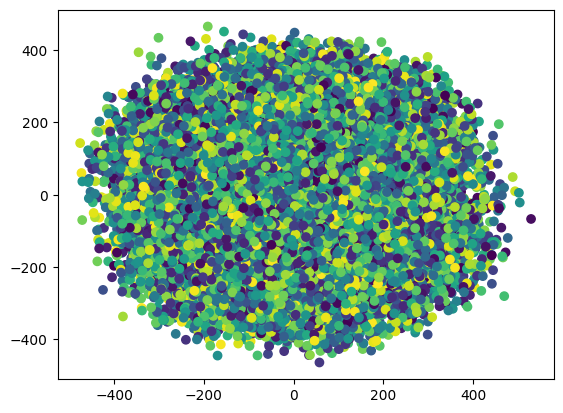

In [191]:
pca = PCA(n_components=2)
flat_data = pca.fit_transform(X, y)
plt.scatter(flat_data[:,0], flat_data[:,1], c=y)

### Outliers - Any feature far from the mean.
There are no observations that have at least one feature more than 3 std's from the mean of the attributes values.

In [192]:
X_std = X.std(axis=0)
X_mean = X.mean(axis=0)

pd.DataFrame({
    "std": X_std,
    "mean": X_mean
})

,std,mean
0,144.336393,249.423944
1,144.022200,250.236267
2,144.107577,248.637289
3,144.284945,249.736600
4,143.941581,249.436178
5,144.329168,249.656167
6,7.038171,-0.011402
7,0.288682,0.498548
8,0.500002,0.499189
9,144.612718,249.842033


In [193]:
X_norm = (X - X_mean)/X_std

X.iloc[np.any(np.abs(X_norm.to_numpy()) > 3, axis=1), :]

,0,1,2,3,4,5,6,7,8,9,...,43,44,45,46,47,48,49,50,51,52


### Outliers - HDBSCAN.
Looking for anomalies using the HDBSCAN algorithm reveals that the data is densly packed together - if we were to find outliers, we would have to treat a big fraction of the entire data as them. This means, HDBSCAN does not reveal any outliers.

In [194]:
hdb = HDBSCAN(min_cluster_size=4, n_jobs=N_JOBS)
cluster_labels = hdb.fit_predict(X, y)

X[cluster_labels == -1]

,0,1,2,3,4,5,6,7,8,9,...,43,44,45,46,47,48,49,50,51,52
11,222,487,143,339,307,321,-8.306624,0.729045,0,482,...,1.689843,14.883748,1.268174,11.952291,5.727112,12.704412,14.635859,11.892229,14.672657,12.163575
14,223,5,26,126,105,465,4.000000,0.271432,1,294,...,14.452884,7.214509,13.066372,11.908762,3.711022,8.236129,1.877742,11.375934,5.897645,5.695726
18,63,373,493,486,281,141,-4.690416,0.546879,0,36,...,9.133173,13.541142,2.923133,4.953387,5.051562,7.656713,11.224154,9.499567,12.618220,3.869190
20,46,140,162,309,127,437,9.695360,0.074206,1,173,...,2.018992,0.347871,1.538244,5.355885,4.903540,4.393307,0.042496,12.949411,7.834778,11.755890
28,325,172,346,463,322,482,8.124038,0.098296,1,339,...,8.663581,7.724104,10.894173,14.296697,0.652855,8.475451,5.029592,13.030706,5.848643,10.832831
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89978,476,362,242,488,446,493,6.082763,0.650465,1,404,...,10.684874,2.748349,7.961621,6.528690,13.789466,10.437229,0.382509,1.656837,10.057413,5.777525
89980,228,349,150,90,27,473,9.000000,0.938433,1,489,...,3.121066,0.793369,7.130496,5.441747,1.933066,4.976283,8.256620,10.975352,5.167072,1.341282
89984,63,443,68,459,107,26,5.744563,0.119348,1,47,...,14.391658,0.375195,9.742451,6.990010,9.761960,4.599184,10.986784,2.003748,0.620462,4.849010
89985,116,55,57,485,491,356,-7.615773,0.885270,0,427,...,10.985415,0.276272,14.955189,11.722830,5.946725,6.584444,3.302072,0.110324,9.978064,13.960392


### Correlation matrix
Nothing interesting here...

In [205]:
train.corrwith(y).sort_values(ascending=False, axis=0)

7     0.012103
26    0.006370
39    0.006283
31    0.005077
25    0.004276
28    0.003451
10    0.003396
44    0.003092
17    0.002953
21    0.002874
3     0.002807
36    0.002624
49    0.002473
0     0.002427
12    0.002016
15    0.001653
37    0.001642
19    0.001520
9     0.001504
34    0.001331
23    0.001280
18    0.001197
46    0.001160
24    0.001070
2     0.001003
6     0.000666
32    0.000561
43    0.000489
8     0.000347
47    0.000319
22    0.000304
20   -0.000456
14   -0.000513
16   -0.000853
45   -0.000903
30   -0.000964
13   -0.001009
48   -0.001183
52   -0.001203
4    -0.001300
27   -0.001459
11   -0.001566
5    -0.002125
33   -0.002301
42   -0.002876
41   -0.003770
38   -0.003845
51   -0.004507
29   -0.004785
50   -0.005243
1    -0.005545
35   -0.006267
40   -0.007216
dtype: float64

### Abs value correlation matrix
Bingo! A correlation of 0.97 on the slightly modified version of the data means that one attribute (#6) will be resposible for the majority of the prediction score.

In [206]:
train.abs().corrwith(y).sort_values(ascending=False, axis=0)

6     0.976704
7     0.012103
26    0.006370
39    0.006283
31    0.005077
25    0.004276
28    0.003451
10    0.003396
44    0.003092
17    0.002953
21    0.002874
3     0.002807
36    0.002624
49    0.002473
0     0.002427
12    0.002016
15    0.001653
37    0.001642
19    0.001520
9     0.001504
34    0.001331
23    0.001280
18    0.001197
46    0.001160
24    0.001070
2     0.001003
32    0.000561
43    0.000489
8     0.000347
47    0.000319
22    0.000304
20   -0.000456
14   -0.000513
16   -0.000853
45   -0.000903
30   -0.000964
13   -0.001009
48   -0.001183
52   -0.001203
4    -0.001300
27   -0.001459
11   -0.001566
5    -0.002125
33   -0.002301
42   -0.002876
41   -0.003770
38   -0.003845
51   -0.004507
29   -0.004785
50   -0.005243
1    -0.005545
35   -0.006267
40   -0.007216
dtype: float64

### XGB feature importance
The results below confirm that attribute #6 is dominant for predicting the value `y`.

In [207]:
model = XGBRegressor(n_estimators=100, n_jobs=N_JOBS)
model.fit(X, y)
pd.DataFrame({"Importance": model.feature_importances_}).sort_values(by="Importance", ascending=False, axis=0)

,Importance
6,9.998720e-01
7,1.018272e-04
16,3.230398e-06
10,1.323332e-06
17,1.314286e-06
19,1.170968e-06
12,1.148180e-06
18,1.140071e-06
48,1.104676e-06
30,1.085410e-06


### All features vs `y` plots
As seen in the charts below, attributes #6 and #8 carry the most information.
Attribute #7 also seems to organize the data in a non-random way.

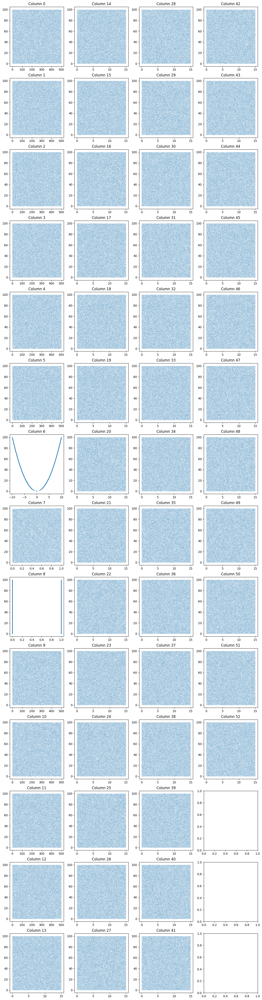

In [198]:
figure, axis = plt.subplots(14, 4, figsize=(15, 60))

for i in range(len(train.columns)):
    axis[i%14, i//14].scatter(X.iloc[:, i], y, s=.01, alpha=.4)
    axis[i%14, i//14].set_title(f"Column {i}")

### A quick closeup...

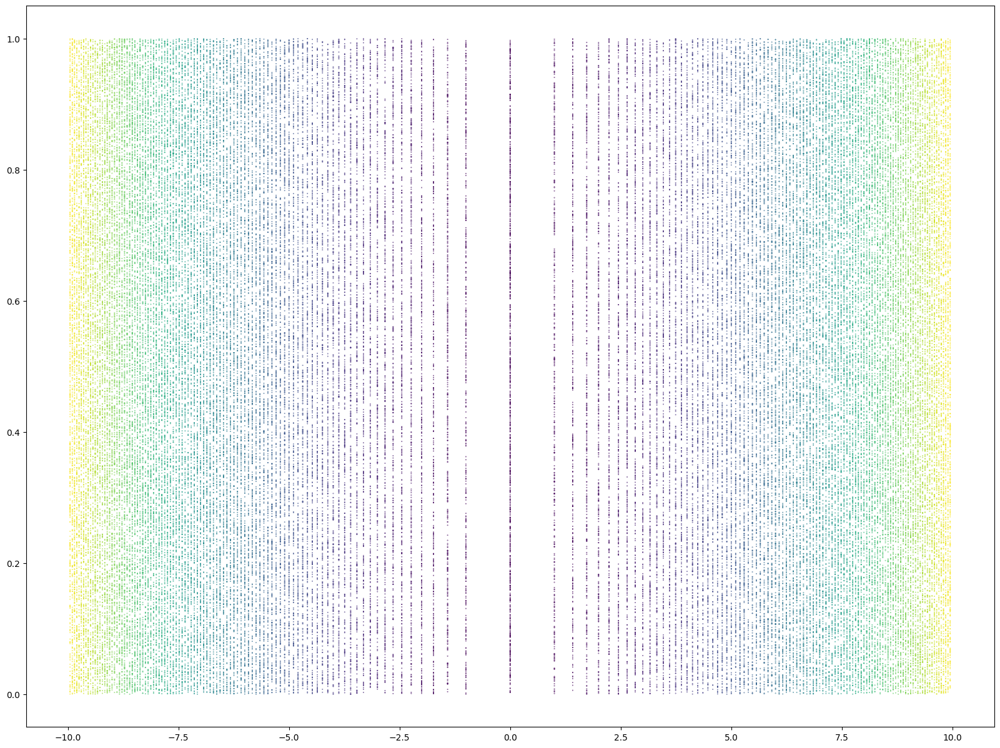

In [199]:
plt.figure(figsize=(20, 15))

plt.scatter(X.iloc[:, 6], X.iloc[:, 7], s=.1, c=y)
plt.show()

# Model evaluation
### All features vs features (6, 7, 8)
As demonstrated below, `XGBRegressor(n_estimators=1000)` works the best on the feature-selected data.

In [4]:
def evaluate_model(model_builder: Callable, use_features: list = None):
    k_fold = KFold(n_splits=5)
    
    X_np = (X.iloc[:, use_features] if use_features else X).to_numpy(dtype=np.float32)
    y_np = y.to_numpy(dtype=np.float32)
    
    scores = []
    for i, (train_index, test_index) in enumerate(k_fold.split(X)):
        
        X_train = X_np[train_index]
        X_test = X_np[test_index]
        y_train = y_np[train_index]
        y_test = y_np[test_index]
        
        model = model_builder() # In order to prevent leaking model param between folds.
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
        score = rmse(y_test, y_pred)
        scores.append(score)
    
    return np.mean(scores)

model_builders = {
    "Ridge": lambda: Ridge(),
    "Lasso": lambda: Lasso(),
    "SGDRegressor": lambda: SGDRegressor(),
    "MLPClassifier(hidden_layer_sizes=(100,))": lambda: MLPRegressor(hidden_layer_sizes=(100,), activation="relu"),
    "MLPClassifier(hidden_layer_sizes=(100, 100))": lambda: MLPRegressor(hidden_layer_sizes=(100, 100), activation="relu"),
    "XGBRegressor(n_estimators=50)": lambda: XGBRegressor(n_estimators=50, n_jobs=N_JOBS),
    "XGBRegressor(n_estimators=100)": lambda: XGBRegressor(n_estimators=100, n_jobs=N_JOBS),
    "XGBRegressor(n_estimators=500)": lambda: XGBRegressor(n_estimators=500, n_jobs=N_JOBS),
    "XGBRegressor(n_estimators=1000)": lambda: XGBRegressor(n_estimators=1000, n_jobs=N_JOBS),
    "HistGradientBoostingRegressor()": lambda: HistGradientBoostingRegressor(),
    "HistGradientBoostingRegressor(max_iter=250, max_leaf_nodes=150)": lambda: HistGradientBoostingRegressor(max_iter=250, max_leaf_nodes=150),
}

scores = {}
for model_name, model_builder in model_builders.items():
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        score = evaluate_model(model_builder, use_features=[6, 7, 8])
        scores[model_name] = round(score, 5)

best_model_name = min(scores, key=scores.get)
print(f"Best model: {best_model_name}")

pd.DataFrame({
    "Model name (features 6, 7, 8)": list(scores.keys()),
    "Regression RMSE": list(scores.values())
}).sort_values(by="Regression RMSE", ascending=True, axis=0)

Best model: XGBRegressor(n_estimators=1000)


,"Model name (features 6, 7, 8)",Regression RMSE
8,XGBRegressor(n_estimators=1000),0.00810
7,XGBRegressor(n_estimators=500),0.00977
10,"HistGradientBoostingRegressor(max_iter=250, ma...",0.01006
9,HistGradientBoostingRegressor(),0.02064
6,XGBRegressor(n_estimators=100),0.02985
3,"MLPClassifier(hidden_layer_sizes=(100,))",0.05751
5,XGBRegressor(n_estimators=50),0.06025
4,"MLPClassifier(hidden_layer_sizes=(100, 100))",0.06493
0,Ridge,28.89694
1,Lasso,28.89715


In [5]:
scores = {}
for model_name, model_builder in model_builders.items():
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        score = evaluate_model(model_builder)
        scores[model_name] = round(score, 5)

best_model_name = min(scores, key=scores.get)
print(f"Best model: {best_model_name}")

pd.DataFrame({
    "Model name (all features)": list(scores.keys()),
    "Regression RMSE": list(scores.values())
}).sort_values(by="Regression RMSE", ascending=True, axis=0)

Best model: HistGradientBoostingRegressor(max_iter=250, max_leaf_nodes=150)


,Model name (all features),Regression RMSE
10,"HistGradientBoostingRegressor(max_iter=250, ma...",1.402000e-02
9,HistGradientBoostingRegressor(),2.036000e-02
8,XGBRegressor(n_estimators=1000),2.326000e-02
7,XGBRegressor(n_estimators=500),2.334000e-02
6,XGBRegressor(n_estimators=100),3.254000e-02
5,XGBRegressor(n_estimators=50),6.108000e-02
4,"MLPClassifier(hidden_layer_sizes=(100, 100))",1.218600e+00
3,"MLPClassifier(hidden_layer_sizes=(100,))",1.620890e+00
1,Lasso,2.889885e+01
0,Ridge,2.890702e+01


# Generate final results

In [202]:
X_test = pd.read_csv('data/hidden_test.csv')

best_model_builder = model_builders[best_model_name]
model = best_model_builder()

model.fit(X.iloc[:, [6, 7, 8]], y)
y_pred = model.predict(X_test)

with open('prediction_results.txt', 'w') as file:
    file.write("\n".join([str(val) for val in y_pred]))